# Advanced Lane Finding Project

## Fourth and final project for Udacity's Self Driving Car Nanodegree - Term 1

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [69]:
import numpy as np
import cv2
import glob
import matplotlib.image as mpimg
%matplotlib inline
import matplotlib.pyplot as plt
from collections import deque

Wait... it will take a few mins
Done


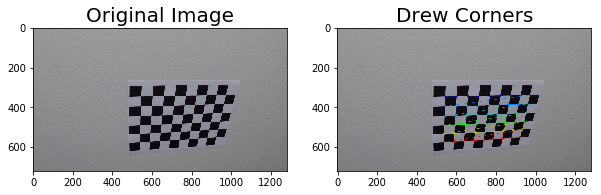

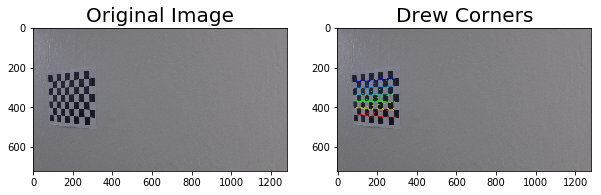

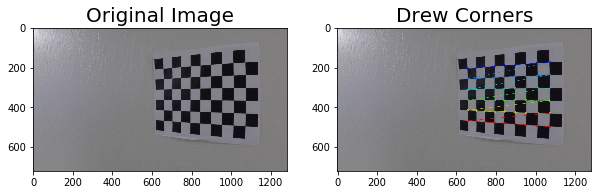

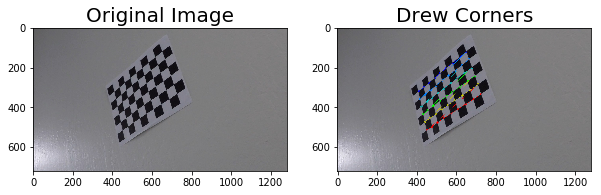

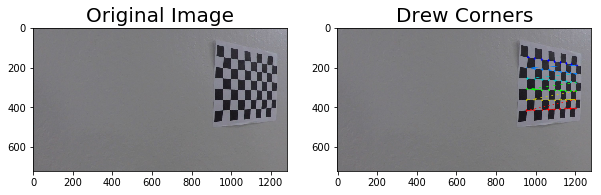

...

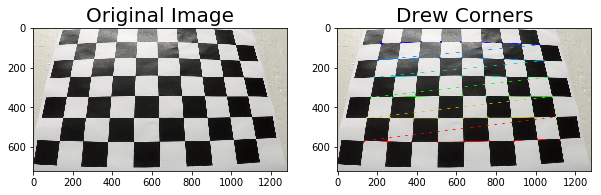

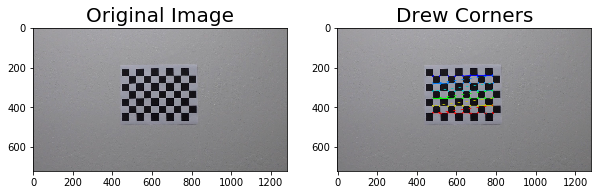

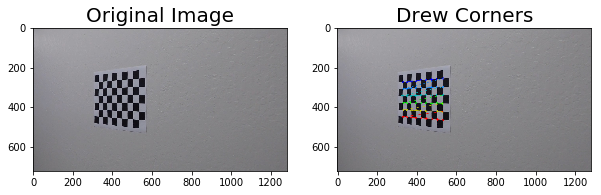

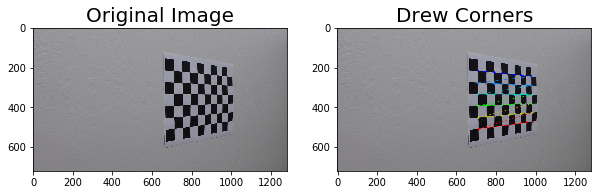

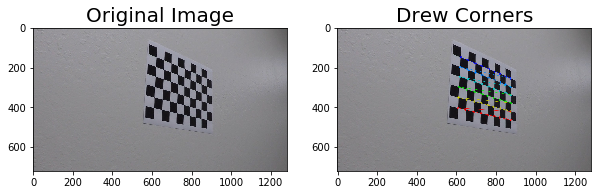

In [4]:
# number of inside corners in (x, y)
nx = 9
ny = 6

objp = np.zeros((nx*ny, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

print("Wait... it will take a few mins")

# Step through the list and search for chessboard corners
for image in images:
    img = cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        # ax1: original image
        ax1.imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=20)
        # ax2: image of drew corners
        ax2.imshow(img)
        ax2.set_title('Drew Corners', fontsize=20)
        

print("Done")


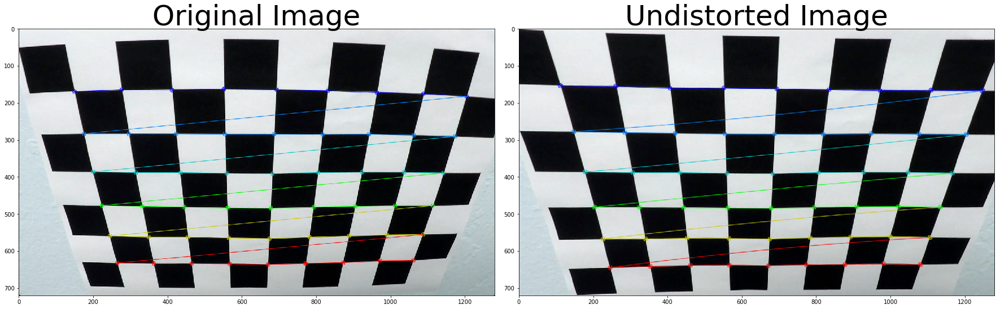

In [6]:
# Generating images to include in readme.md

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
dst = cv2.undistort(img1[10], mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img1[10])
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [30]:
def distort_correction(image, objp=objpoints, imgp=imgpoints, imgread=True, display=True):
    if imgread:
        img = cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB)
    else:
        img = image
        
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objp, imgp, img_size, None, None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=20)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=20)
    else:
        return dst

Wait... it will take a few mins
Done


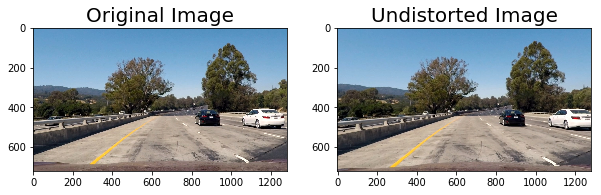

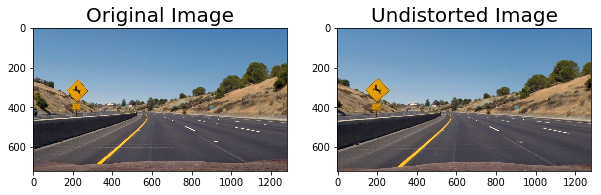

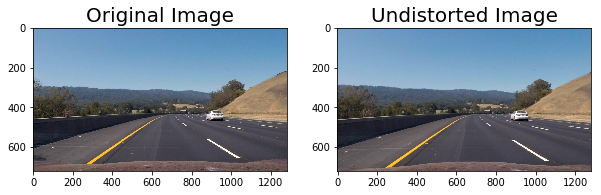

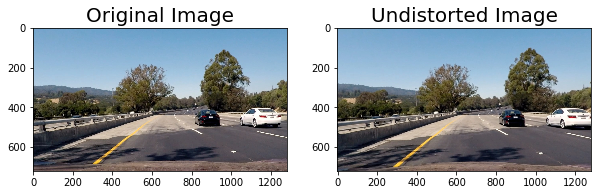

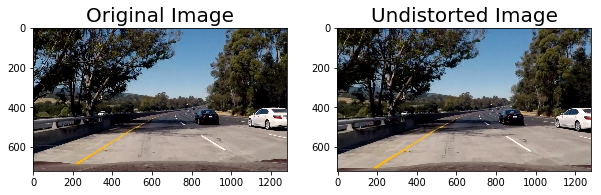

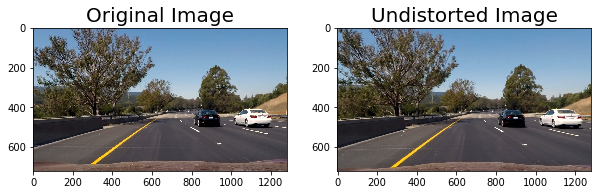

In [31]:
images = glob.glob('test_images/test*.jpg')

print("Wait... it will take a few mins")

# Show images compare original and undistorted
for image in images:
    distort_correction(image)
    
print("Done")

In [27]:
def warper(image, offset=0, corx1=0.4, corx2=0.6, cory=0.7, imgread=True, display=True):
    if imgread:
        img = distort_correction(image, display=False)
    else:
        img = distort_correction(image, imgread=False, display=False)
        
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32([[img_size[0]*corx1, img_size[1]*cory],
                      [img_size[0]*corx2, img_size[1]*cory], 
                      [img_size[0]-offset, img_size[1]-offset], 
                      [offset, img_size[1]-offset]])
    
    dst = np.float32([[offset, offset], 
                      [img_size[0]-offset, offset], 
                      [img_size[0]-offset, img_size[1]-offset], 
                      [offset, img_size[1]-offset]])

    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size)
    
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
        ax1.imshow(img)
        ax1.set_title('Undistored Image', fontsize=20)
        ax2.imshow(warped)
        ax2.set_title('Perspective-changed Image', fontsize=20)
    else:
        return M, warped, src, dst, img

Wait... it will take a few mins
Done


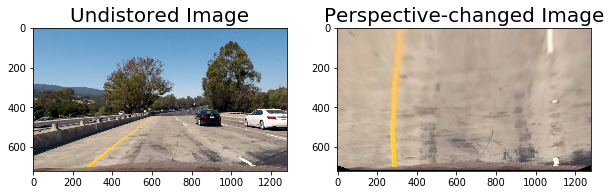

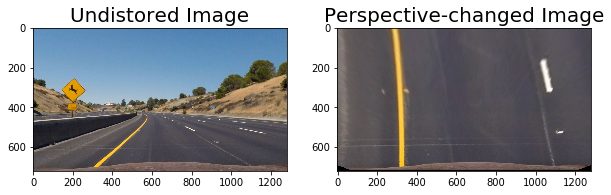

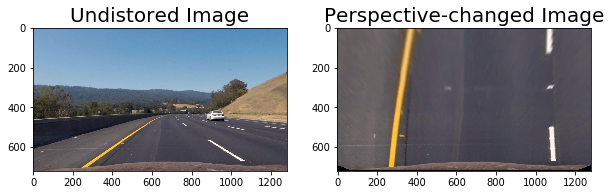

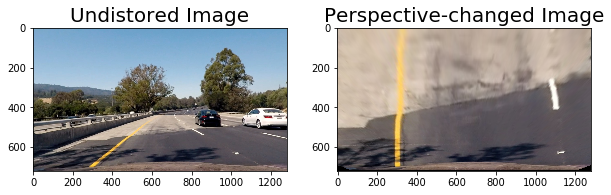

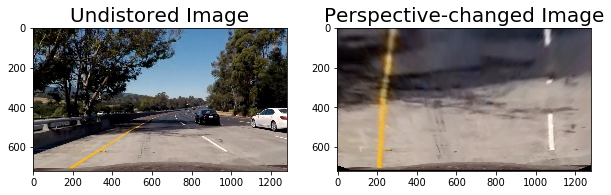

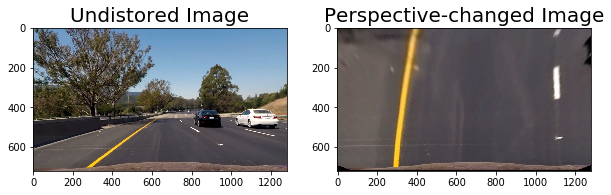

In [33]:
print("Wait... it will take a few mins")

for image in images:
    warper(image, offset=30, corx1=0.38, corx2=0.63, cory=0.67)
    
print("Done")

In [35]:
def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0,255), display=True):
    # Grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Apply cv2.Sobel()
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the output from cv2.Sobel()
    abs_sobel = np.absolute(sobel)
    # Scale the result to an 8-bit range (0-255)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(image)
        ax1.set_title('Warped Image', fontsize=20)
        ax2.imshow(binary_output, cmap='gray')
        ax2.set_title('Gradient ' + orient.upper(), fontsize=20)
    else:
        return binary_output

Wait... it will take a few mins
Done


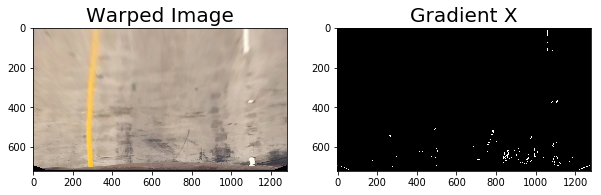

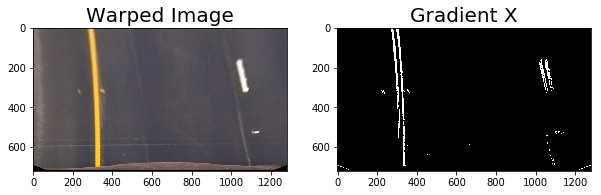

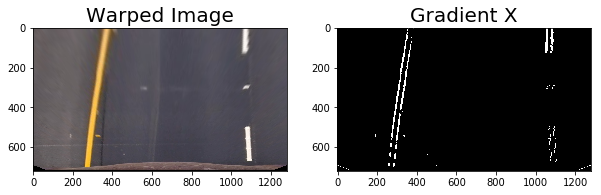

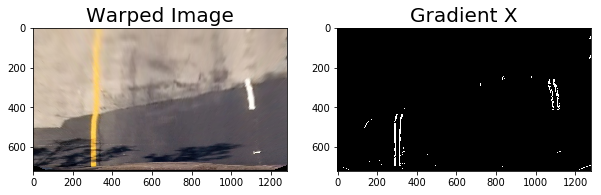

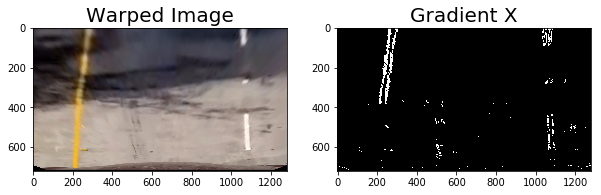

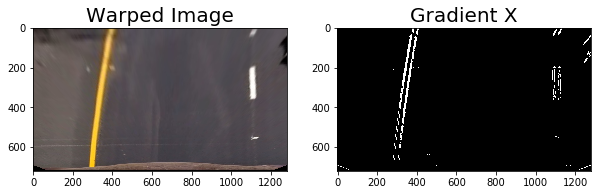

In [37]:
print("Wait... it will take a few mins")

for image in images:
    _, image, _, _, _ = warper(image, offset=30, corx1=0.38, corx2=0.63, cory=0.67, display=False)
    abs_sobel_thresh(image, orient='x', sobel_kernel=7, thresh=(40, 100))
    
print("Done")

Wait... it will take a few mins
Done


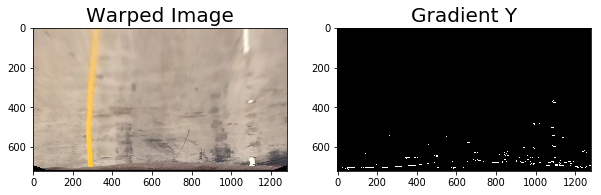

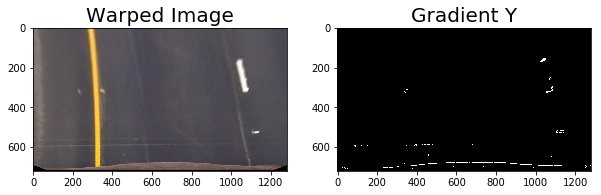

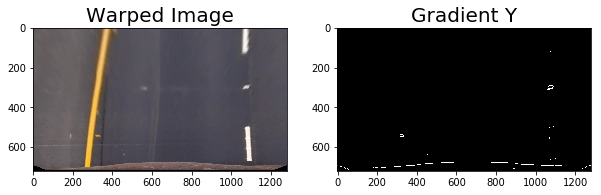

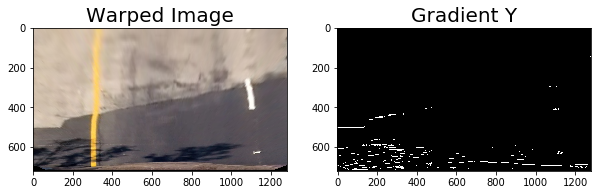

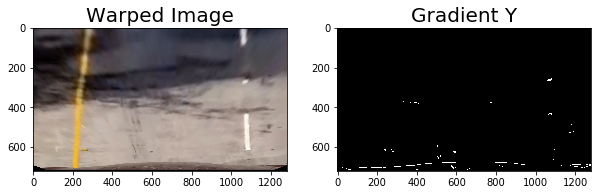

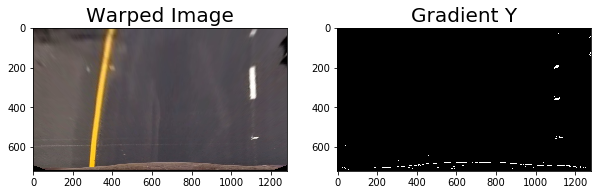

In [38]:
print("Wait... it will take a few mins")

for image in images:
    _, image, _, _, _ = warper(image, offset=30, corx1=0.38, corx2=0.63, cory=0.67, display=False)
    abs_sobel_thresh(image, orient='y', sobel_kernel=7, thresh=(40, 100))
    
print("Done")

In [40]:
def mag_thresh(image, sobel_kernel=3, mag_thresh=(0,255), display=True):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobelxy = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    binary_output = np.zeros_like(scaled_sobelxy)
    binary_output[(scaled_sobelxy >= mag_thresh[0]) & (scaled_sobelxy <= mag_thresh[1])] = 1
    
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(image)
        ax1.set_title('Warped Image', fontsize=20)
        ax2.imshow(binary_output, cmap='gray')
        ax2.set_title('Magnitude', fontsize=20)
    else:
        return binary_output

Wait... it will take a few mins
Done


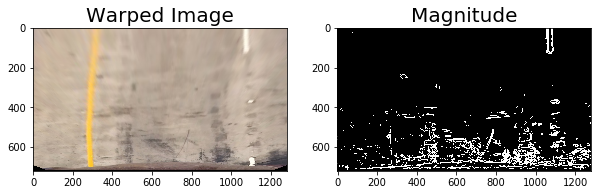

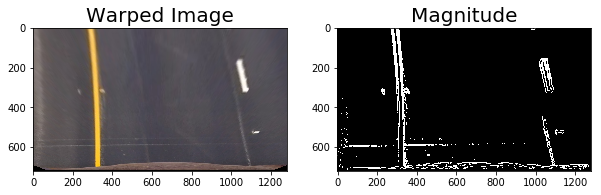

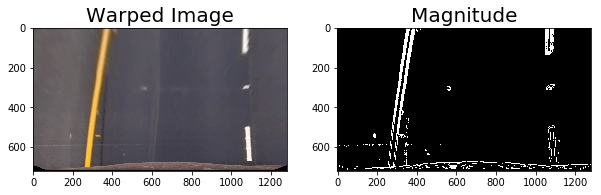

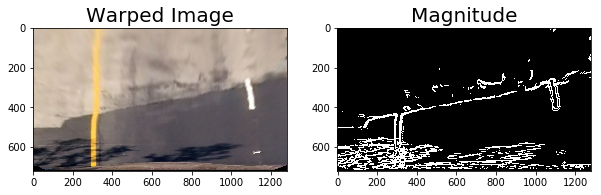

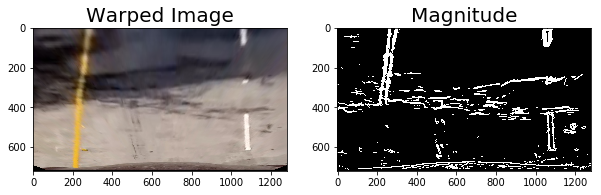

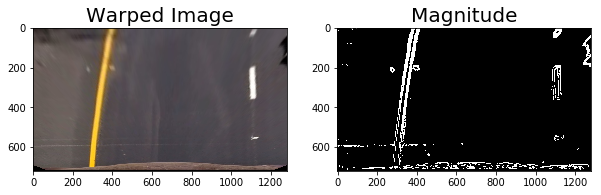

In [41]:
print("Wait... it will take a few mins")

for image in images:
    _, image, _, _, _ = warper(image, offset=30, corx1=0.38, corx2=0.63, cory=0.67, display=False)
    mag_thresh(image, sobel_kernel=9, mag_thresh=(15, 70))

print("Done")

In [42]:
def dir_thresh(image, sobel_kernel=3, dir_thresh=(0,np.pi/2), display=True):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    arctansobel = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(arctansobel)
    binary_output[(arctansobel >= dir_thresh[0]) & (arctansobel <= dir_thresh[1])] = 1
    
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(image)
        ax1.set_title('Warped Image', fontsize=20)
        ax2.imshow(binary_output, cmap='gray')
        ax2.set_title('Direction', fontsize=20)
    else:
        return binary_output

Wait... it will take a few mins
Done


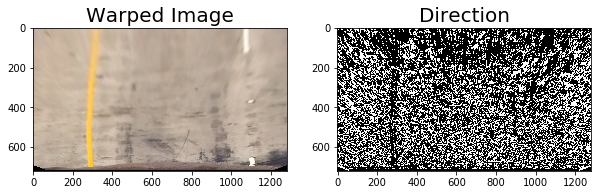

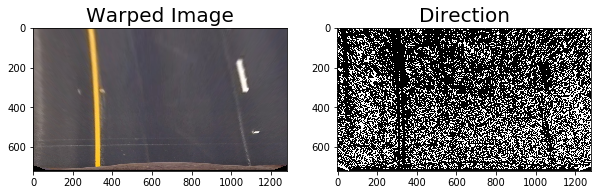

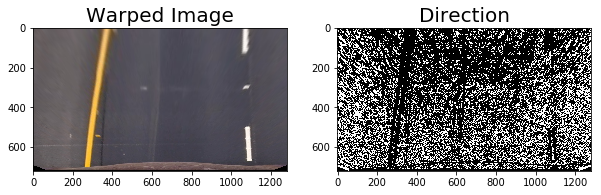

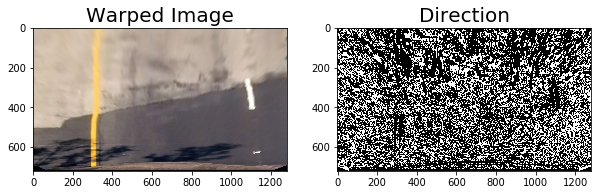

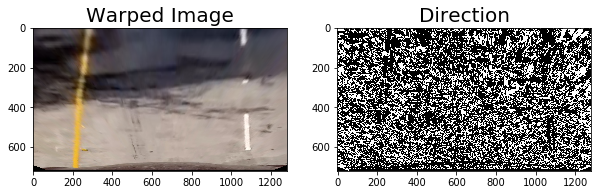

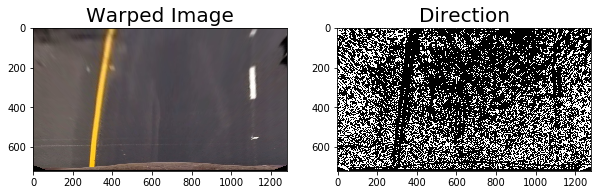

In [44]:
print("Wait... it will take a few mins")

for image in images:
    _, image, _, _, _ = warper(image, offset=30, corx1=0.38, corx2=0.63, cory=0.67, display=False)
    dir_thresh(image, sobel_kernel=11, dir_thresh=(0.7, 1.3))
    
print("Done")

In [48]:
def rgb_thresh(image, rgb, rgb_thresh=(0,255), display=True):
    if rgb == 'r':
        channel = image[:,:,0]
    elif rgb == 'g':
        channel = image[:,:,1]
    elif rgb == 'b':
        channel = image[:,:,2]
    
    binary_output = np.zeros_like(channel)
    binary_output[(channel > rgb_thresh[0]) & (channel <= rgb_thresh[1])] = 1
    
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(image)
        ax1.set_title('Warped Image', fontsize=20)
        ax2.imshow(binary_output, cmap='gray')
        ax2.set_title('RGB - ' + rgb.upper(), fontsize=20)
    else:
        return binary_output

Wait... it will take a few mins
Done


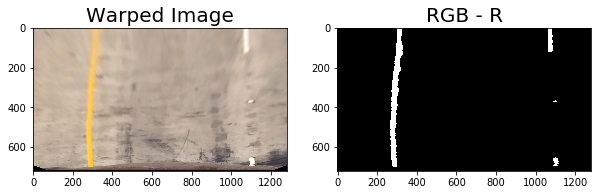

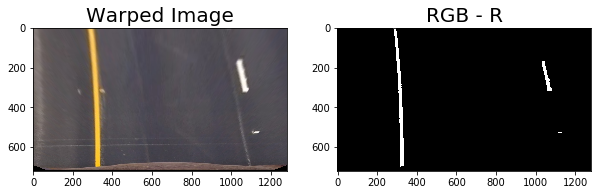

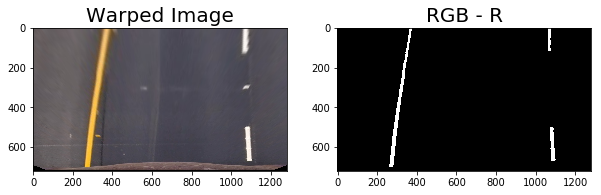

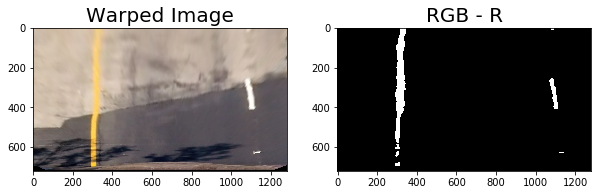

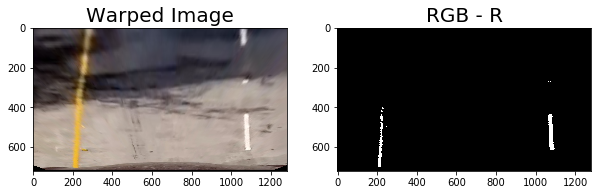

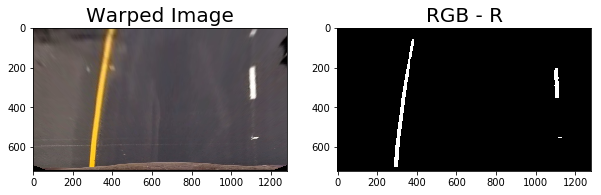

In [49]:
print("Wait... it will take a few mins")

for image in images:
    _, image, _, _, _ = warper(image, offset=30, corx1=0.38, corx2=0.63, cory=0.67, display=False)
    rgb_thresh(image, rgb='r', rgb_thresh=(230, 255))
    
print("Done")

Wait... it will take a few mins
Done


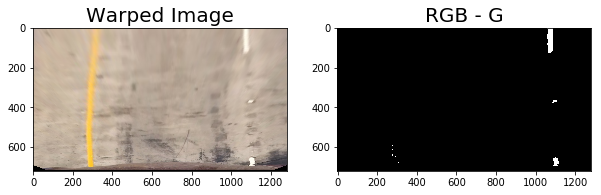

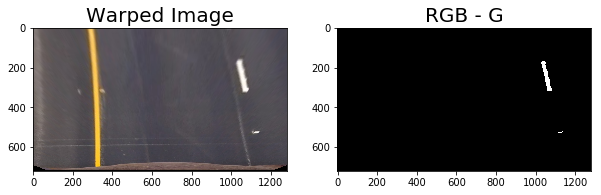

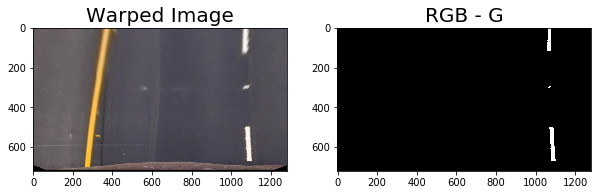

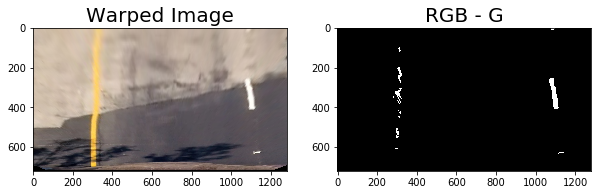

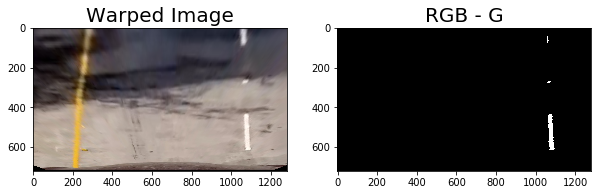

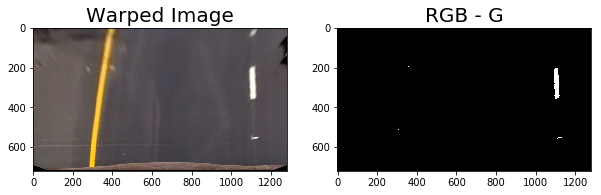

In [51]:
print("Wait... it will take a few mins")

for image in images:
    _, image, _, _, _ = warper(image, offset=30, corx1=0.38, corx2=0.63, cory=0.67, display=False)
    rgb_thresh(image, rgb='g', rgb_thresh=(210, 255))
    
print("Done")

Wait... it will take a few mins
Done


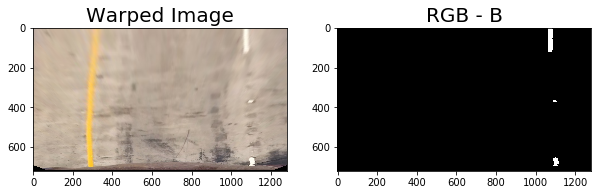

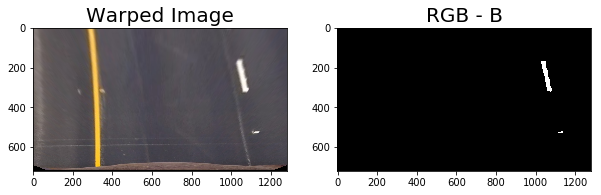

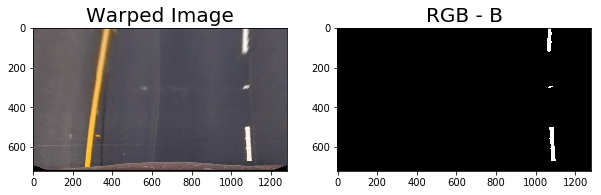

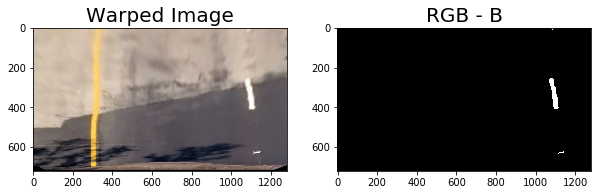

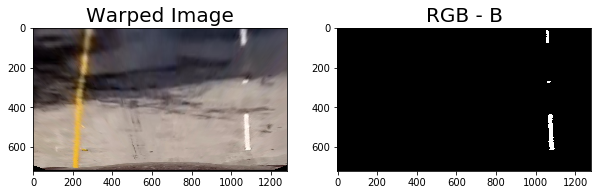

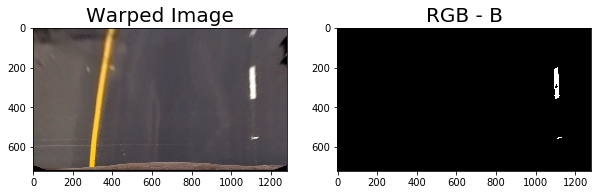

In [52]:
print("Wait... it will take a few mins")

for image in images:
    _, image, _, _, _ = warper(image, offset=30, corx1=0.38, corx2=0.63, cory=0.67, display=False)
    rgb_thresh(image, rgb='b', rgb_thresh=(200, 250))

print("Done")

In [54]:
def hls_thresh(image, hls, hls_thresh=(0,255), display=True):
    img = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    if hls == 'h':
        channel = img[:,:,0]
    elif hls == 'l':
        channel = img[:,:,1]
    elif hls == 's':
        channel = img[:,:,2]
        
    binary_output = np.zeros_like(channel)
    binary_output[(channel > hls_thresh[0]) & (channel <= hls_thresh[1])] = 1
    
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(image)
        ax1.set_title('Warped Image', fontsize=20)
        ax2.imshow(binary_output, cmap='gray')
        ax2.set_title('HLS - ' + hls.upper(), fontsize=20)
    else:
        return binary_output

Wait... it will take a few mins
Done


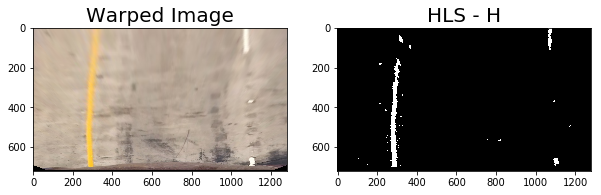

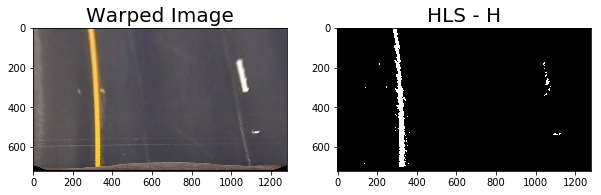

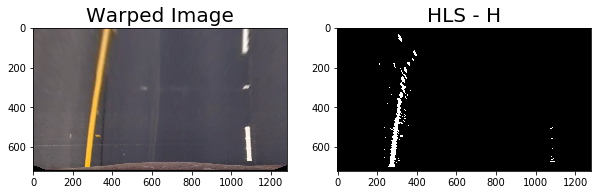

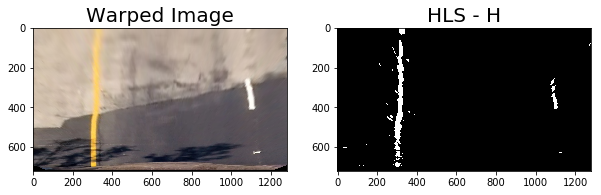

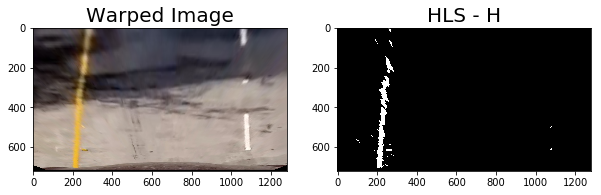

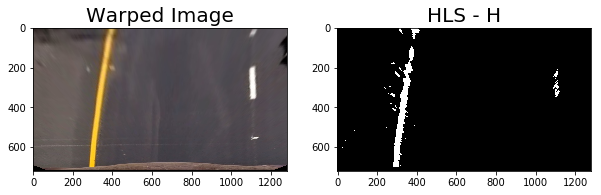

In [56]:
print("Wait... it will take a few mins")

for image in images:
    _, image, _, _, _ = warper(image, offset=30, corx1=0.38, corx2=0.63, cory=0.67, display=False)
    hls_thresh(image, hls='h', hls_thresh=(19, 60))
    
print("Done")

Wait... it will take a few mins
Done


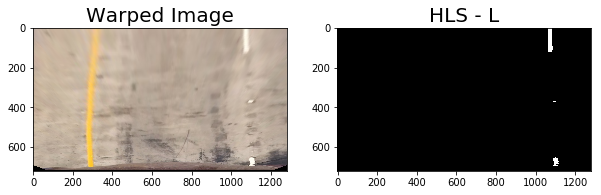

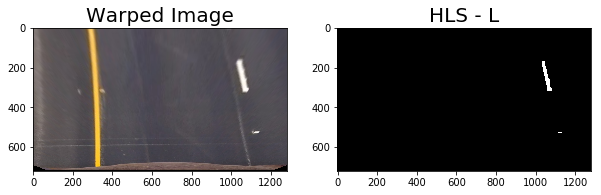

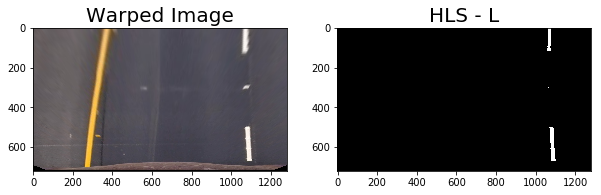

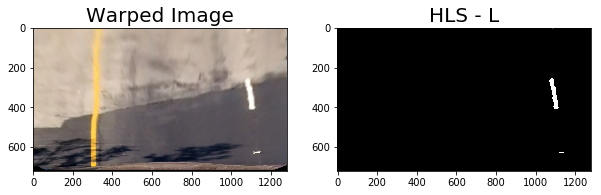

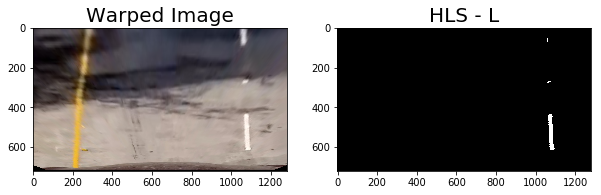

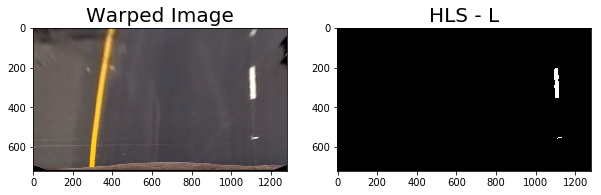

In [57]:
print("Wait... it will take a few mins")

for image in images:
    _, image, _, _, _ = warper(image, offset=30, corx1=0.38, corx2=0.63, cory=0.67, display=False)
    hls_thresh(image, hls='l', hls_thresh=(220, 255))
    
print("Done")

Wait... it will take a few mins
Done


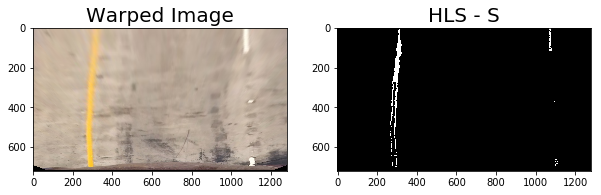

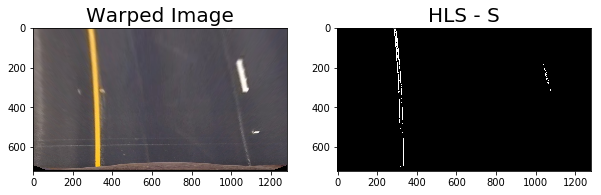

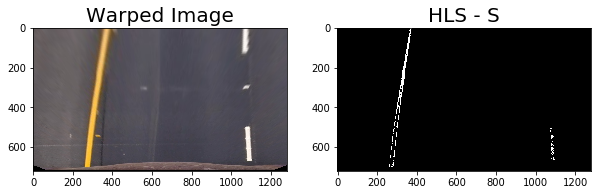

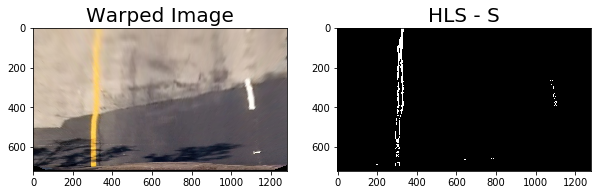

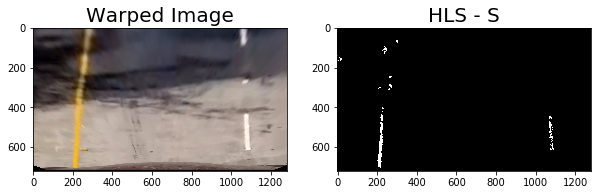

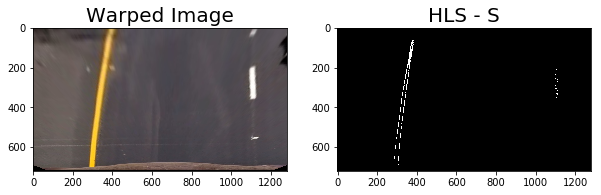

In [58]:
print("Wait... it will take a few mins")

for image in images:
    _, image, _, _, _ = warper(image, offset=30, corx1=0.38, corx2=0.63, cory=0.67, display=False)
    hls_thresh(image, hls='s', hls_thresh=(190, 240))
    
print("Done")

In [62]:
def combined_thresh(image,
                    offset=0, corx1=0.4, corx2=0.6, cory=0.7,
                    m_kernel=3, m_thresh=(0, 255),
                    r_thresh=(0,255),
                    b_thresh=(0,255),
                    h_thresh=(0, 255),
                    l_thresh=(0,255),
                    imgread=True,
                    display=True):
    
    """
    image: original image file
    offset, corx1, corx2, cory: arguments of warped()
    m_kernel: kernel size of magnitude
    m_thresh: threshold of magnitude
    r_thresh: threshold of R on RGB
    b_thresh: threshold of B on RGB
    h_thresh: threshold of H on HLS
    l_thresh: threshold of L on HLS
    display: plot images or return combined result
    """
    
    if imgread:
        _, img, src, dst, undist = warper(image, offset, corx1, corx2, cory, display=False)
    else:
        _, img, src, dst, undist = warper(image, offset, corx1, corx2, cory, imgread=False, display=False)
    
    magnitude = mag_thresh(img, sobel_kernel=m_kernel, mag_thresh=m_thresh, display=False)
    r_channel = rgb_thresh(img, rgb='r', rgb_thresh=r_thresh, display=False)
    b_channel = rgb_thresh(img, rgb='b', rgb_thresh=b_thresh, display=False)
    h_channel = hls_thresh(img, hls='h', hls_thresh=h_thresh, display=False)
    l_channel = hls_thresh(img, hls='l', hls_thresh=l_thresh, display=False)
    
    mag_and_h_channel = np.zeros_like(magnitude)
    combined = np.zeros_like(r_channel)
    # 'And operation' with magnitude and h_channel
    mag_and_h_channel[(magnitude == 1) & (h_channel == 1)] = 1
    # 'Or operations' with r_channel, b_channel, l_channel, and result of 'And operation'
    combined[(mag_and_h_channel == 1) | (r_channel == 1) | (b_channel == 1) | (l_channel == 1)] = 1

    if display:
        f, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(3, 3, figsize=(10, 7))
        f.tight_layout()
        
        ax1.imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=20)
        ax2.imshow(img)
        ax2.set_title('Warped Image', fontsize=20)
        ax3.imshow(combined, cmap='gray')
        ax3.set_title('Combined', fontsize=20)
        
        ax4.imshow(magnitude, cmap='gray')
        ax4.set_title('Magnitude', fontsize=20)
        ax5.imshow(h_channel, cmap='gray')
        ax5.set_title('H threshold', fontsize=20)
        ax6.imshow(mag_and_h_channel, cmap='gray')
        ax6.set_title('Magnitude and H', fontsize=20)
        
        ax7.imshow(r_channel, cmap='gray')
        ax7.set_title('R threshold', fontsize=20)
        ax8.imshow(b_channel, cmap='gray')
        ax8.set_title('B threshold', fontsize=20)
        ax9.imshow(l_channel, cmap='gray')
        ax9.set_title('L threshold', fontsize=20)
    else:
        return combined, src, dst, undist

Wait... it will take a few mins
Done


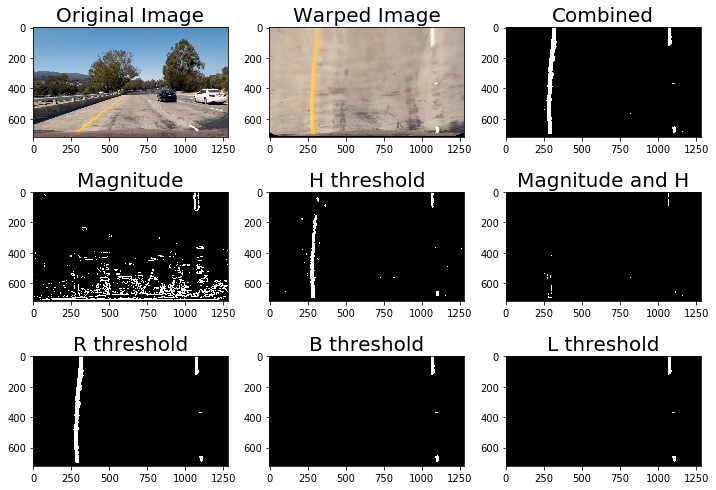

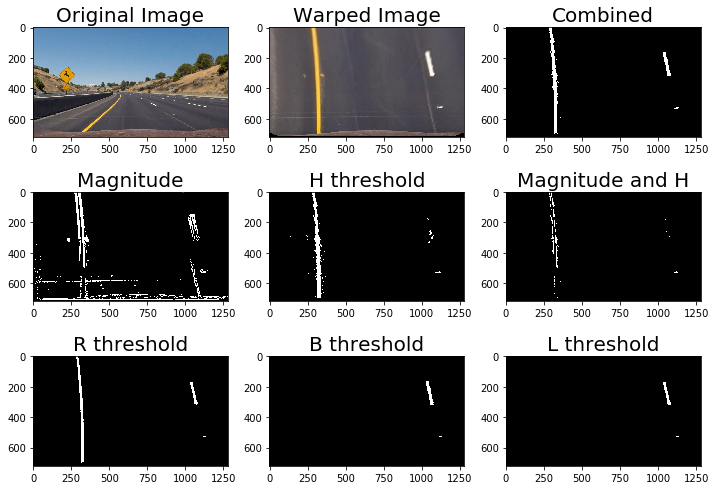

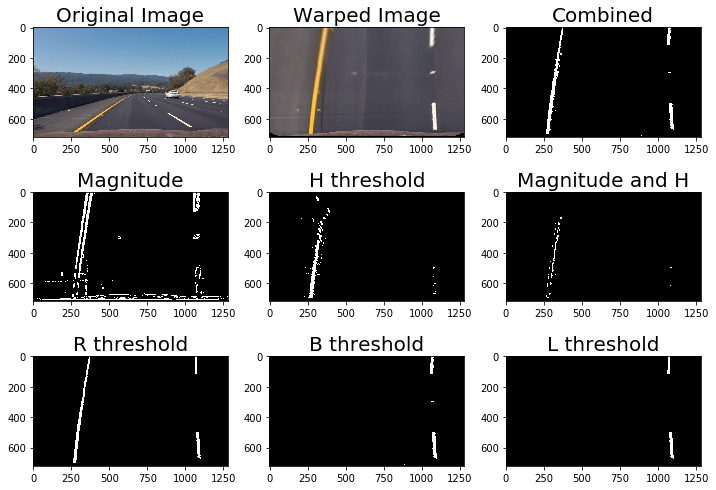

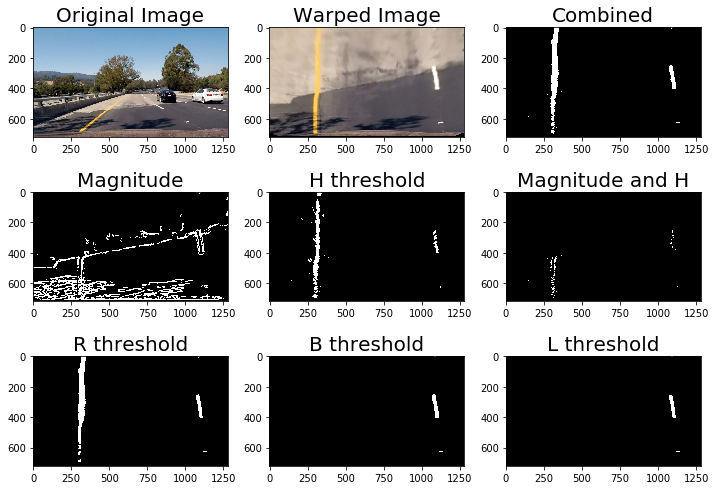

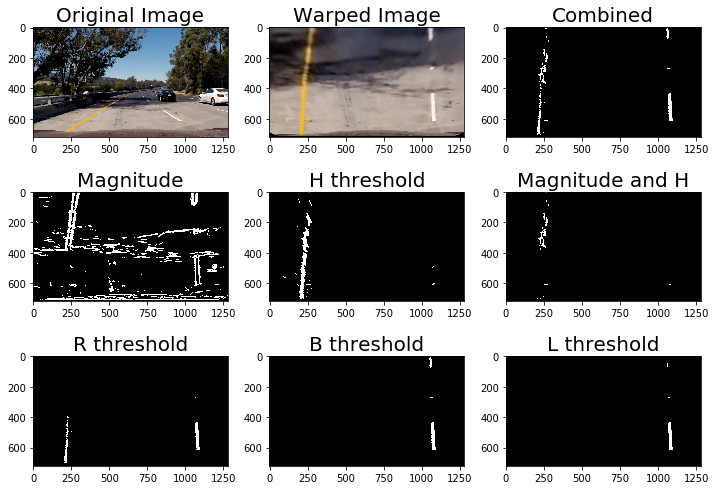

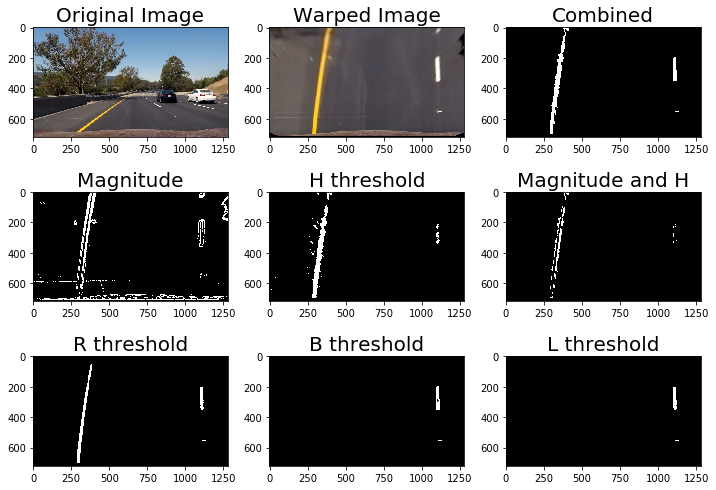

In [63]:
print("Wait... it will take a few mins")

for image in images:
    combined_thresh(image,
                    offset=30, corx1=0.38, corx2=0.63, cory=0.67,
                    m_kernel=9, m_thresh=(15, 70),
                    r_thresh=(230,255),
                    b_thresh=(200,250),
                    h_thresh=(19, 60),
                    l_thresh=(220,255))
    
print("Done")

In [66]:
class Line:
    def __init__(self):
        # Was the line found in the last iteration?
        self.found = False
        # x and y values of the last n fits of the line
        self.X = None
        self.Y = None
        # Store recent x intercepts for averaging across frames
        self.x_int = deque(maxlen=10)
        self.top = deque(maxlen=10)
        # Remember previous x intercept to compare against current one
        self.lastx_int = None
        self.last_top = None
        # Remember radius of curvature
        self.radius = None
        # Store recent polynomial coefficients for averaging across frames
        self.fit0 = deque(maxlen=10)
        self.fit1 = deque(maxlen=10)
        self.fit2 = deque(maxlen=10)
        self.fitx = None
        self.pts = []
        # Count the number of frames
        self.count = 0
        
        
    def found_search(self, x, y):
        # Apply when the lane lines have been detected in the previous frame
        xvals = []
        yvals = []
        if self.found == True: 
            i = 720
            j = 630
            while j >= 0:
                yval = np.mean([i,j])
                xval = (np.mean(self.fit0))*yval**2 + (np.mean(self.fit1))*yval + (np.mean(self.fit2))
                x_idx = np.where((((xval - 25) < x)&(x < (xval + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    np.append(xvals, x_window)
                    np.append(yvals, y_window)
                i -= 90
                j -= 90
        if np.sum(xvals) == 0: 
            self.found = False # If no lane pixels were detected then perform blind search
        return xvals, yvals, self.found
    
    
    def blind_search(self, x, y, image):
        # Apply in the first few frames and/or if the lane was not successfully detected in the previous frame
        xvals = []
        yvals = []
        if self.found == False: 
            i = 720
            j = 630
            while j >= 0:
                histogram = np.sum(image[j:i,:], axis=0)
                if self == Right:
                    peak = np.argmax(histogram[640:]) + 640
                else:
                    peak = np.argmax(histogram[:640])
                x_idx = np.where((((peak - 25) < x)&(x < (peak + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    xvals.extend(x_window)
                    yvals.extend(y_window)
                i -= 90
                j -= 90
        if np.sum(xvals) > 0:
            self.found = True
        else:
            yvals = self.Y
            xvals = self.X
        return xvals, yvals, self.found
    
    
    def radius_of_curvature(self, xvals, yvals):
        # meters per pixel in y dimension
        ym_per_pix = 15./720
        # meteres per pixel in x dimension
        xm_per_pix = 3.7/800
        y_eval = np.max(yvals)
        fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
        return curverad
    
    
    def sort_vals(self, xvals, yvals):
        sorted_index = np.argsort(yvals)
        sorted_yvals = yvals[sorted_index]
        sorted_xvals = xvals[sorted_index]
        return sorted_xvals, sorted_yvals
    
    
    def get_intercepts(self, polynomial):
        bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
        top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
        return bottom, top

In [75]:

def draw_lane(image, video=True):
    if video:
        combined, src, dst, undist = combined_thresh(image,
                                                     offset=30, corx1=0.38, corx2=0.63, cory=0.67,
                                                     m_kernel=9, m_thresh=(15, 70),
                                                     r_thresh=(230,255),
                                                     b_thresh=(200,250),
                                                     h_thresh=(19, 60),
                                                     l_thresh=(220,255),
                                                     imgread=False,
                                                     display=False)
    else:
        combined, src, dst, undist = combined_thresh(image,
                                                     offset=30, corx1=0.38, corx2=0.63, cory=0.67,
                                                     m_kernel=9, m_thresh=(15, 70),
                                                     r_thresh=(230,255),
                                                     b_thresh=(200,250),
                                                     h_thresh=(19, 60),
                                                     l_thresh=(220,255),
                                                     display=False)

    x = np.nonzero(np.transpose(combined))[0]
    y = np.nonzero(np.transpose(combined))[1]
    
    # Search for left lane pixels around previous polynomial
    if Left.found == True: 
        leftx, lefty, Left.found = Left.found_search(x, y)
    
    # Search for right lane pixels around previous polynomial
    if Right.found == True: 
        rightx, righty, Right.found = Right.found_search(x, y)

    # Perform blind search for right lane lines
    if Right.found == False: 
        rightx, righty, Right.found = Right.blind_search(x, y, combined)
    
    # Perform blind search for left lane lines
    if Left.found == False:
        leftx, lefty, Left.found = Left.blind_search(x, y, combined)

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
            
    # Calculate left polynomial fit based on detected pixels
    left_fit = np.polyfit(lefty, leftx, 2)
    
    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    leftx_int, left_top = Left.get_intercepts(left_fit)
    
    # Average intercepts across n frames
    Left.x_int.append(leftx_int)
    Left.top.append(left_top)
    leftx_int = np.mean(Left.x_int)
    left_top = np.mean(Left.top)
    Left.lastx_int = leftx_int
    Left.last_top = left_top
    
    # Add averaged intercepts to current x and y vals
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx, left_top)
    lefty = np.append(lefty, 0)
    
    # Sort detected pixels based on the yvals
    leftx, lefty = Left.sort_vals(leftx, lefty)
    Left.X = leftx
    Left.Y = lefty
    
    # Recalculate polynomial with intercepts and average across n frames
    left_fit = np.polyfit(lefty, leftx, 2)
    Left.fit0.append(left_fit[0])
    Left.fit1.append(left_fit[1])
    Left.fit2.append(left_fit[2])
    left_fit = [np.mean(Left.fit0), 
                np.mean(Left.fit1), 
                np.mean(Left.fit2)]
    
    # Fit polynomial to detected pixels
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    Left.fitx = left_fitx
    
    # Calculate right polynomial fit based on detected pixels
    right_fit = np.polyfit(righty, rightx, 2)

    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    rightx_int, right_top = Right.get_intercepts(right_fit)
    
    # Average intercepts across 5 frames
    Right.x_int.append(rightx_int)
    rightx_int = np.mean(Right.x_int)
    Right.top.append(right_top)
    right_top = np.mean(Right.top)
    Right.lastx_int = rightx_int
    Right.last_top = right_top
    rightx = np.append(rightx, rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx, right_top)
    righty = np.append(righty, 0)
    
    # Sort right lane pixels
    rightx, righty = Right.sort_vals(rightx, righty)
    Right.X = rightx
    Right.Y = righty
    
    # Recalculate polynomial with intercepts and average across n frames
    right_fit = np.polyfit(righty, rightx, 2)
    Right.fit0.append(right_fit[0])
    Right.fit1.append(right_fit[1])
    Right.fit2.append(right_fit[2])
    right_fit = [np.mean(Right.fit0), np.mean(Right.fit1), np.mean(Right.fit2)]
    
    # Fit polynomial to detected pixels
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    Right.fitx = right_fitx
        
    # Compute radius of curvature for each lane in meters
    left_curverad = Left.radius_of_curvature(leftx, lefty)
    right_curverad = Right.radius_of_curvature(rightx, righty)
        
    # Only print the radius of curvature every 3 frames for improved readability
    if Left.count % 3 == 0:
        Left.radius = left_curverad
        Right.radius = right_curverad
        
    # Calculate the vehicle position relative to the center of the lane
    position = (rightx_int+leftx_int)/2
    distance_from_center = abs((640 - position)*3.7/800) 
                
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left.fitx, Left.Y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, Right.Y]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(255,0,0), thickness = 60)
    cv2.fillPoly(color_warp, np.int_(pts), (30,255,0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (combined.shape[1], combined.shape[0]))
    result = cv2.addWeighted(undist, 1, newwarp, 0.5, 0)
        
    # Print distance from center on image
    if position > 640:
        cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 1.5, color=(255,255,255), thickness = 3)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 1.5, color=(255,255,255), thickness = 3)
    # Print radius of curvature on image
    cv2.putText(result, 'Radius of Curvature {}(m)'.format(int((Left.radius+Right.radius)/2)), (120,140),
             fontFace = 16, fontScale = 1.5, color=(255,255,255), thickness = 3)
    Left.count += 1
    return result

Wait...It will take a few minutes


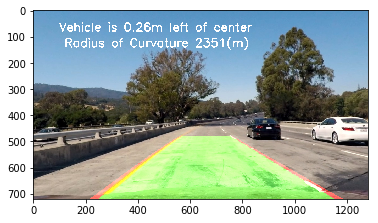

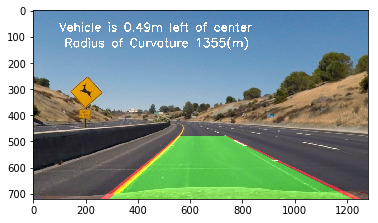

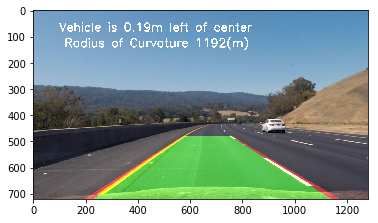

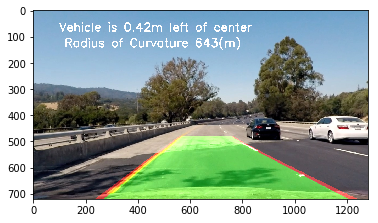

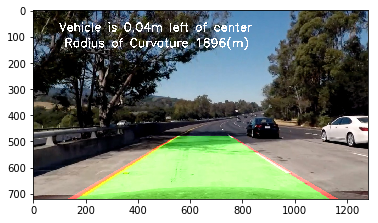

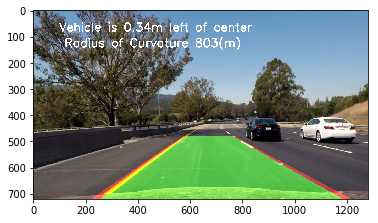

Done


In [76]:
print("Wait...It will take a few minutes")

for image in images:
    Left = Line()
    Right = Line()
    result = draw_lane(image, video=False)
    plt.imshow(result)
    plt.show()
    
print("Done")

In [79]:
from moviepy.editor import VideoFileClip

Left = Line()
Right = Line()

video_output = "project_video_output.mp4"
video_input = VideoFileClip("project_video.mp4")
final_output = video_input.fl_image(draw_lane)
%time final_output.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|███████████████████████████████▉| 1260/1261 [22:50<00:01,  1.07s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 22min 52s


In [81]:
from IPython.display import HTML

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("project_video_output.mp4"))

In [82]:
Left = Line()
Right = Line()

video_output = "challenge_video_output.mp4"
video_input = VideoFileClip("challenge_video.mp4")
final_output = video_input.fl_image(draw_lane)
%time final_output.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████████████████████████████| 485/485 [07:47<00:00,  1.12it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

Wall time: 7min 49s


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("challenge_video_output.mp4"))

In [ ]:
Left = Line()
Right = Line()

video_output = "harder_challenge_video_output.mp4"
video_input = VideoFileClip("harder_challenge_video.mp4")
final_output = video_input.fl_image(draw_lane)
%time final_output.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


  1%|▍                                 | 15/1200 [00:18<23:38,  1.20s/it]

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("harder_challenge_video_output.mp4"))